In [1]:
import sys
!{sys.executable} -m pip -q install palantir fa2

In [2]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [4]:
RGC = sc.read_h5ad("/mnt/c/Bioinf/HUMAN_FETAL_RETINA/COMBINED_EKPB_v1_RGC_ONLY.h5ad")

In [29]:
RGC = sc.read_h5ad('/mnt/c/Bioinf/HUMAN_FETAL_RETINA/RGC.h5ad')

In [30]:
RGC

AnnData object with n_obs × n_vars = 8026 × 36144
    obs: 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'X', 'barcode', 'sample', 'Age', 'Retina_Cells', 'percent.rb', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1', 'seurat_clusters', 'pANN_0.25_0.19_814', 'DF.classifications_0.25_0.19_814', 'DF.classifications_0.25_0.19_756', 'origin', 'timepoint', 'pANN_0.25_0.005_732', 'DF.classifications_0.25_0.005_732', 'DF.classifications_0.25_0.005_675', 'pANN_0.25_0.21_844', 'DF.classifications_0.25_0.21_844', 'DF.classifications_0.25_0.21_771', 'pANN_0.25_0.08_516', 'DF.classifications_0.25_0.08_516', 'DF.classifications_0.25_0.08_467', 'pANN_0.25_0.25_1019', 'DF.classifications_0.25_0.25_1019', 'DF.classifications_0.25_0.25_950', 'pANN_0.25_0.01_308', 'DF.classifications_0.25_0.01_308', 'DF.classifications_0.25_0.01_278', 'pANN_0.25_0.3_734', 'DF.classifications_0.25_0.3_734', 'DF.classifications_0.25_0.3_672', 'pANN_0.25_0.08_357', 'DF.classifications_0.25_0.08_357', 'DF.classi

In [7]:
RGC.obs['timepoint']

Hgw11.AAACCTGAGACAATAC.1_1    Week 11
Hgw11.AAACCTGAGACGCTTT.1_1    Week 11
Hgw11.AAACCTGAGTTGAGTA.1_1    Week 11
Hgw11.AAACCTGTCGATCCCT.1_1    Week 11
Hgw11.AAACGGGAGATGCCAG.1_1    Week 11
                               ...   
TCACTCGAGCCAAGCA-1_23         Day 125
TCCATCGGTGCCTACG-1_23         Day 125
TGCATCCGTCGAACGA-1_23         Day 125
TTACAGGCAACCACAT-1_23         Day 125
TTTACTGGTTAAACCC-1_23         Day 125
Name: timepoint, Length: 8026, dtype: category
Categories (19, object): ['Day 59', 'Day 80', 'Day 82', 'Day 105', ..., 'Week 20', 'Week 22', 'Week 24', 'Week 27']

In [8]:
sc.pp.pca(RGC, n_comps=50)
pca_projections = pd.DataFrame(RGC.obsm["X_pca"],index=RGC.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=3)
RGC.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(RGC,n_neighbors=50,use_rep="X_palantir")
RGC.obsm["X_pca2d"]=RGC.obsm["X_pca"][:,:2]
sc.tl.draw_graph(RGC,init_pos='X_pca2d')

computing PCA
    with n_comps=50
    finished (0:00:14)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:24)


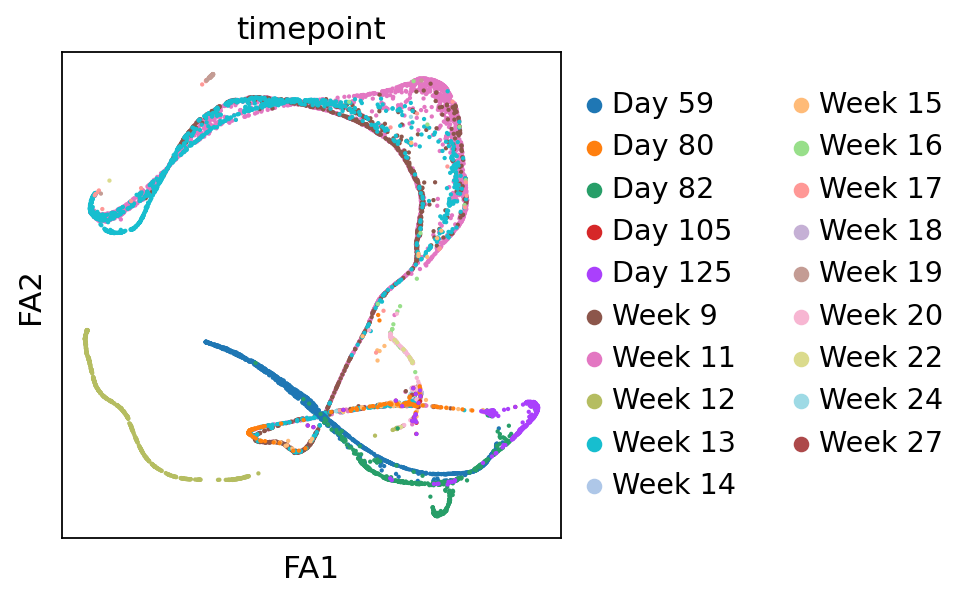

In [9]:
sc.pl.draw_graph(RGC,color=["timepoint"])

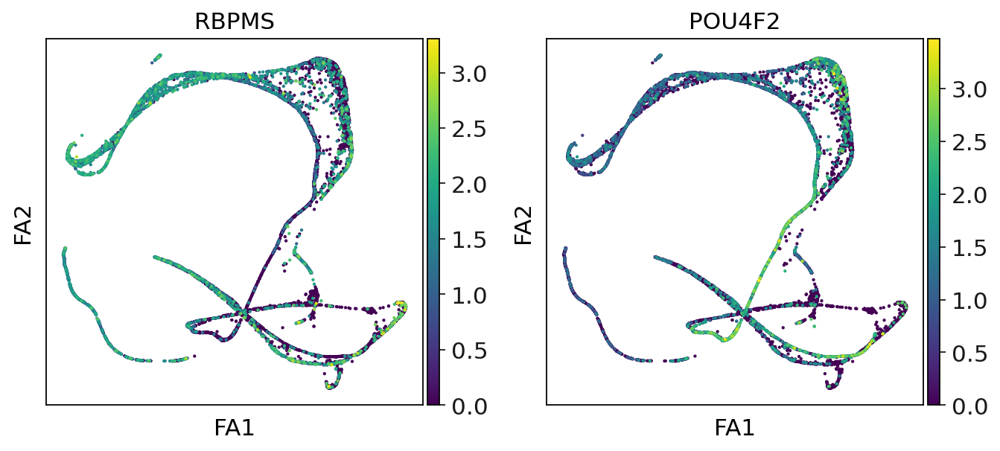

In [10]:
sc.pl.draw_graph(RGC,color=["RBPMS",'POU4F2'], use_raw = False)

In [62]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.draw_graph(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs, save = 'cluster_multiplies.pdf'
    )

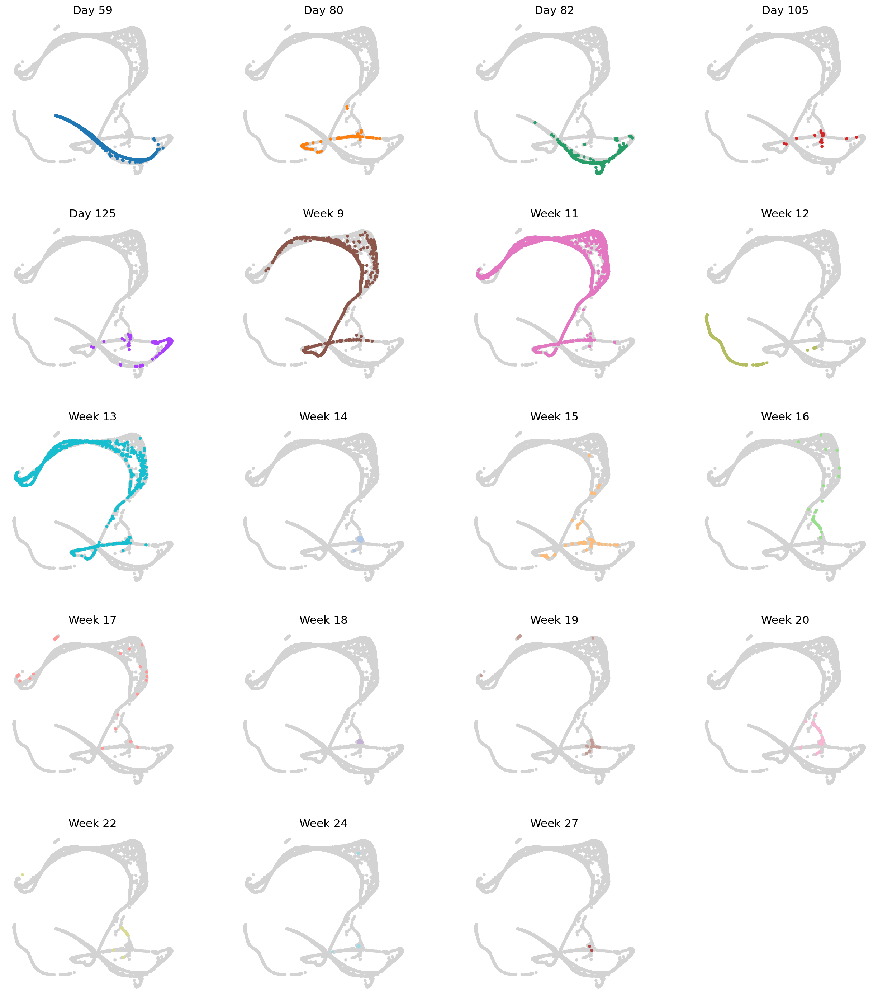

In [12]:
cluster_small_multiples(RGC, clust_key = 'timepoint')

In [13]:
sc.pp.combat(RGC, key='timepoint')

Standardizing Data across genes.

Found 19 batches

Found 0 numerical variables:
	

Found 13405 genes with zero variance.
Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



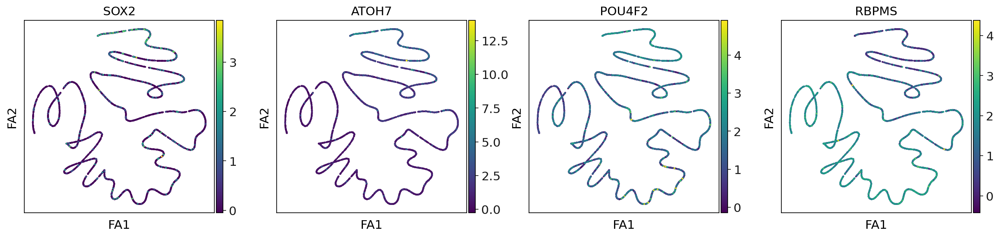

In [31]:
sc.pl.draw_graph(RGC,color=["SOX2",'ATOH7','POU4F2','RBPMS'], use_raw = False)

In [16]:
sc.pp.pca(RGC, n_comps=30)
pca_projections = pd.DataFrame(RGC.obsm["X_pca"],index=RGC.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=2)
RGC.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(RGC,n_neighbors=30,use_rep="X_palantir")
RGC.obsm["X_pca2d"]=RGC.obsm["X_pca"][:,:2]
sc.tl.draw_graph(RGC,init_pos='X_pca2d')

computing PCA
    with n_comps=30
    finished (0:00:24)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:25)


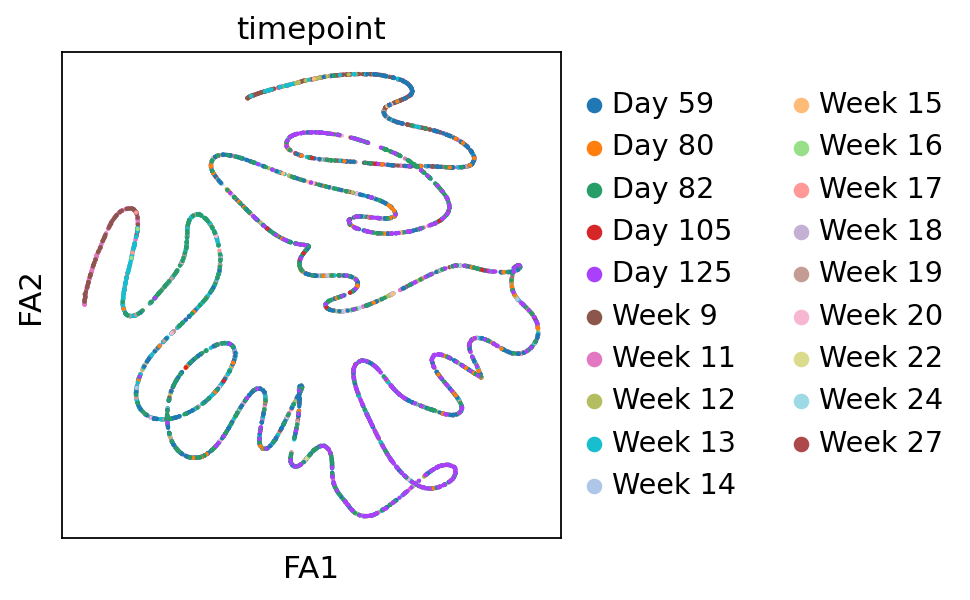

In [25]:
sc.pl.draw_graph(RGC,color=["timepoint"], save = 'fa1.pdf')

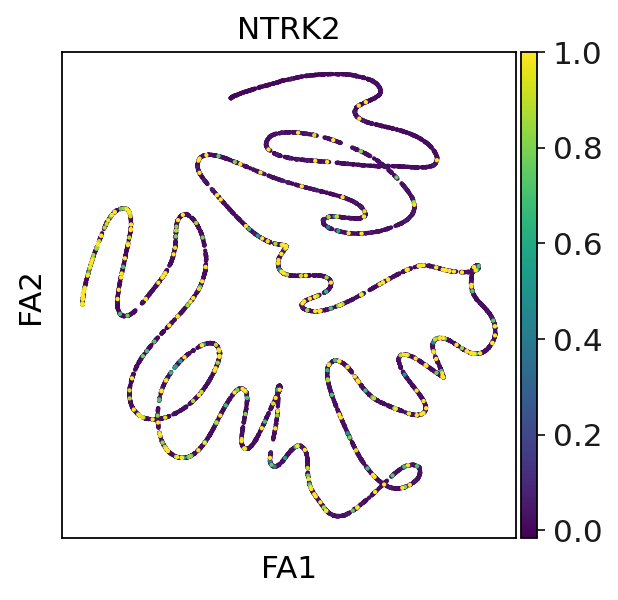

In [65]:
sc.pl.draw_graph(RGC,color=["NTRK2"], use_raw = False, vmax = 1) #, save = 'fa1.pdf'

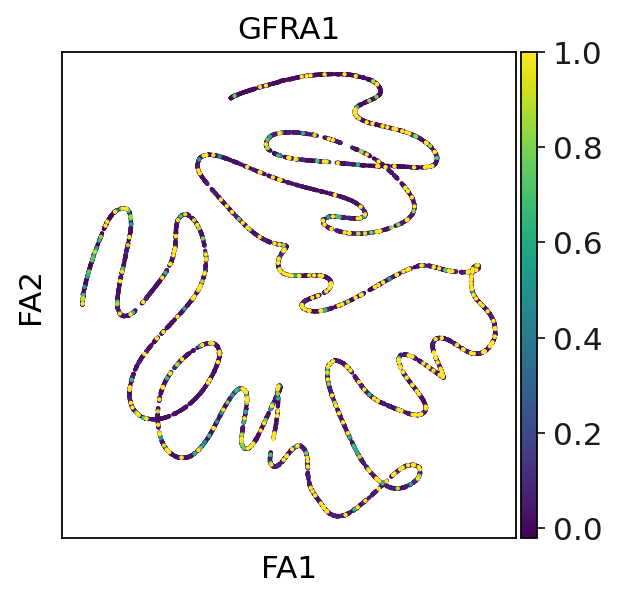

In [66]:
sc.pl.draw_graph(RGC,color=["GFRA1"], use_raw = False, vmax = 1)

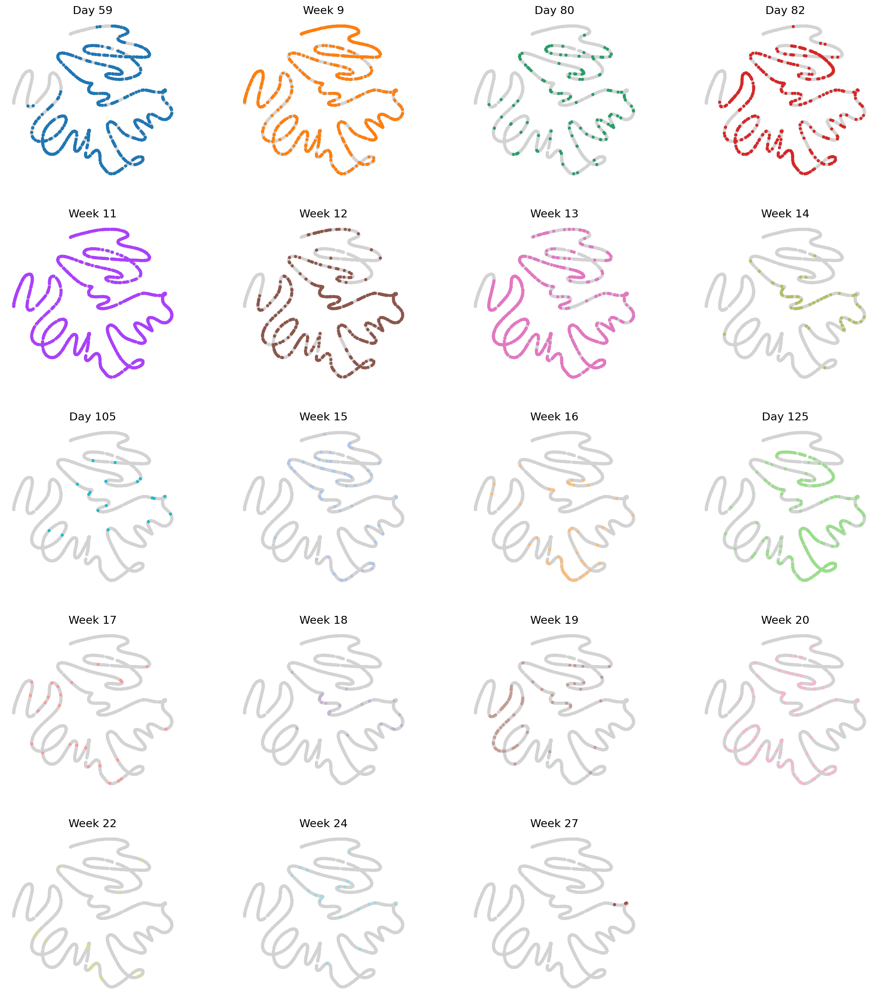

In [63]:
cluster_small_multiples(RGC, clust_key = 'timepoint')

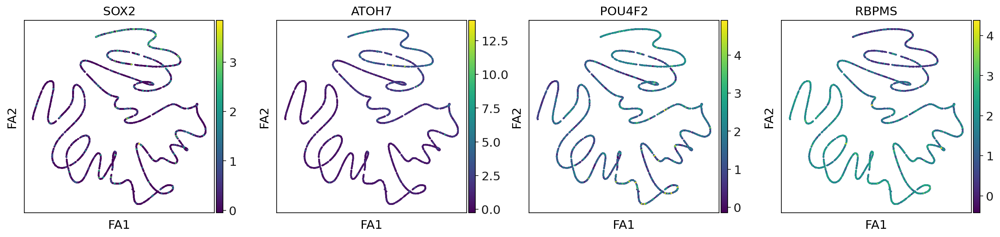

In [20]:
sc.pl.draw_graph(RGC,color=["SOX2",'ATOH7','POU4F2','RBPMS'], use_raw = False)

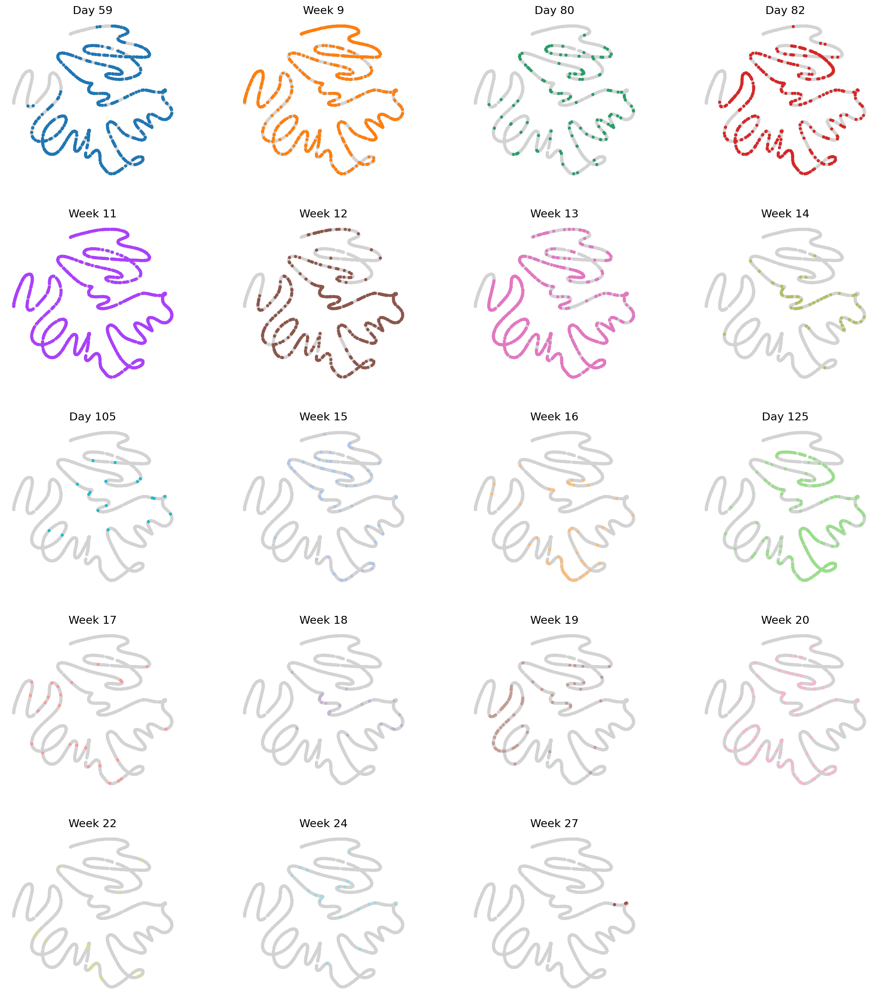

In [60]:
cluster_small_multiples(RGC, clust_key = 'timepoint')

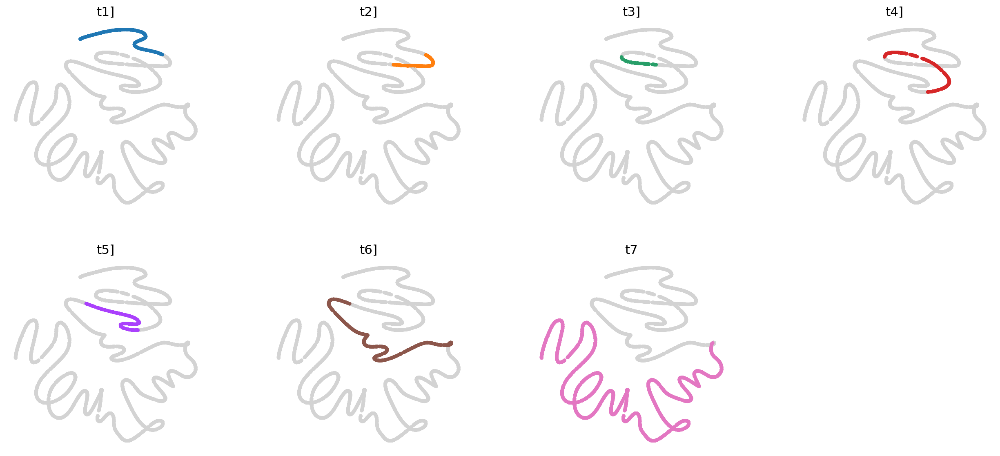

In [61]:
cluster_small_multiples(RGC, clust_key = 't_factor')

In [21]:
scf.tl.tree(RGC,method="ppt",Nodes=500,use_rep="palantir",
            device="cpu",seed=1,ppt_lambda=1000,ppt_sigma=0.005,ppt_nsteps=500)

inferring a principal tree --> parameters used 
    500 principal points, sigma = 0.005, lambda = 1000, metric = euclidean
    fitting:  60%|████████████████████████████████████████▌                           | 298/500 [01:26<00:58,  3.44it/s]


KeyboardInterrupt: 

In [ ]:
scf.pl.graph(RGC)

In [57]:
scf.tl.root(RGC,22)

node 22 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [58]:
scf.tl.pseudotime(RGC,n_jobs=20,n_map=100,seed=1)

projecting cells onto the principal graph
    mappings: 100%|███████████████████████████████████████████████████████████████████| 100/100 [00:52<00:00,  1.90it/s]
    finished (0:00:54) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


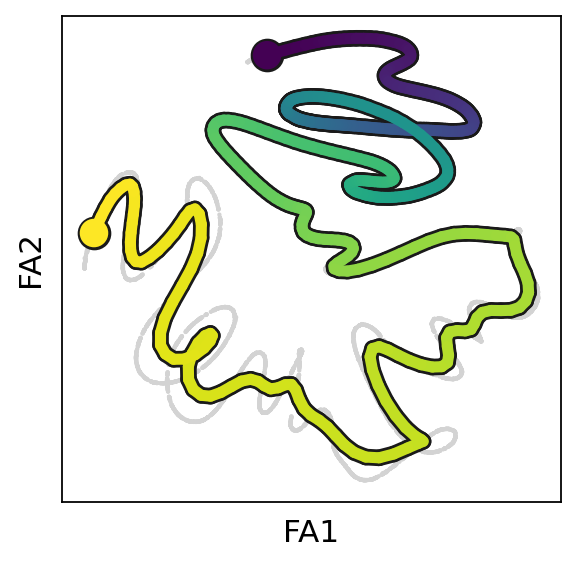

In [27]:
scf.pl.trajectory(RGC, save = 'trajectory.pdf')

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


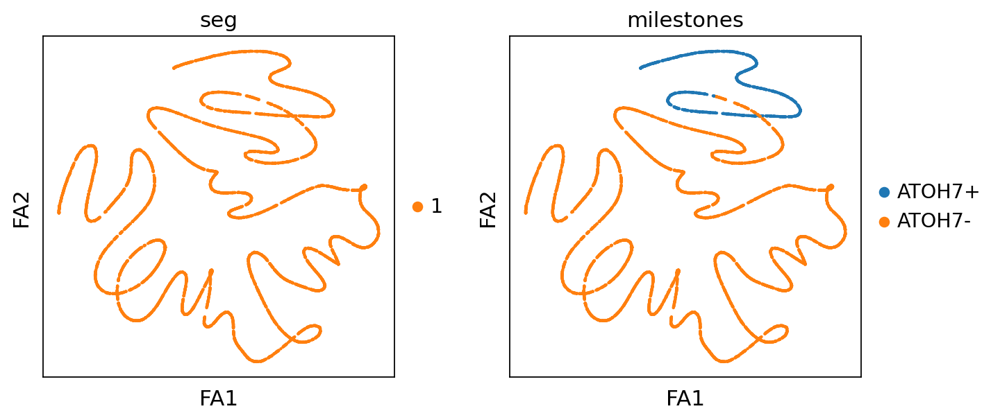

In [4]:
sc.pl.draw_graph(RGC,color=["seg","milestones"])


In [63]:
scf.tl.rename_milestones(RGC,["ATOH7+",'ATOH7-'])
# we change the color of the root milestone for better visualisations


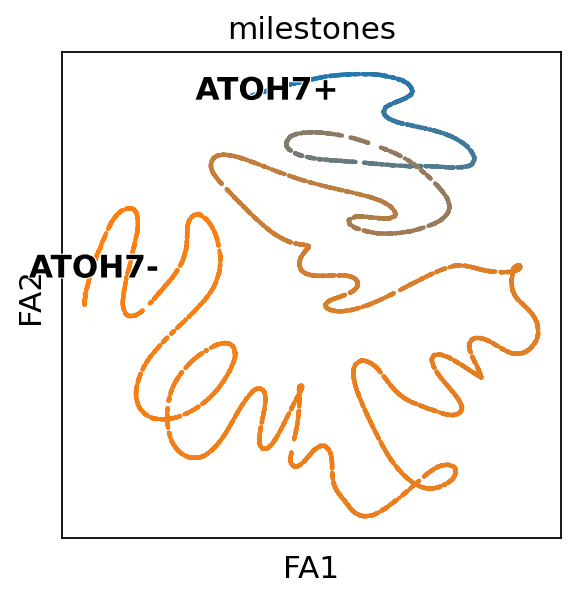

In [64]:
scf.pl.milestones(RGC,annotate=True)

In [65]:
scf.tl.dendrogram(RGC)

Generating dendrogram of tree
    segment : 100%|███████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00, 12.85s/it]
    finished (0:00:12) --> added 
    .obsm['X_dendro'], new embedding generated.
    .uns['dendro_segments'] tree segments used for plotting.


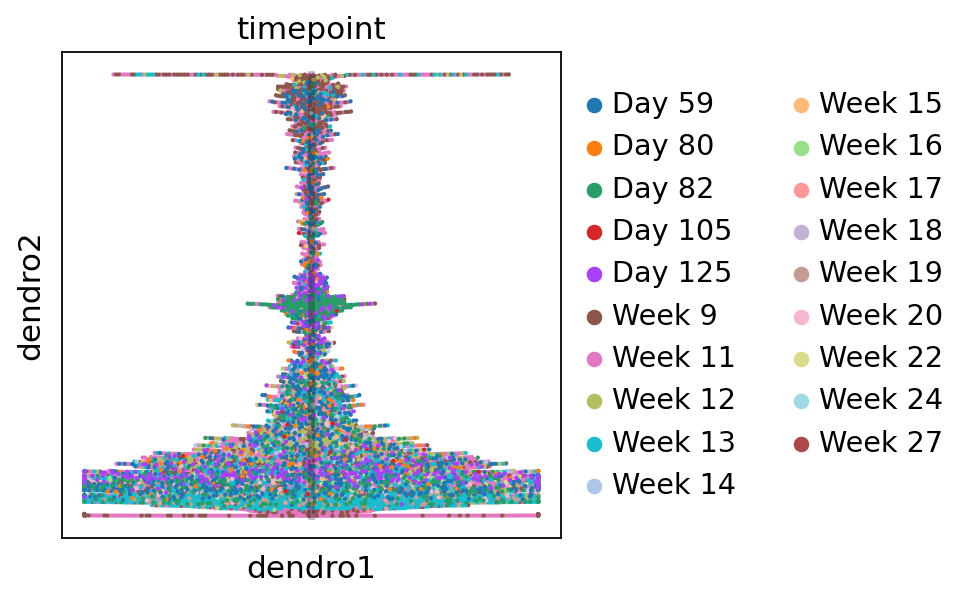

In [5]:
scf.pl.dendrogram(RGC,color="timepoint")

In [76]:
RGC.__dict__['_raw'].__dict__['_var'] = RGC.__dict__['_raw'].__dict__['_var'].rename(columns={'_index': 'features'})

In [77]:
RGC.write_h5ad('/mnt/c/Bioinf/HUMAN_FETAL_RETINA/RGC.h5ad')

Estimation of deviation from linearity
    cells on the bridge: 100%|██████████████████████████████████████████████████████| 4829/4829 [02:14<00:00, 36.00it/s]


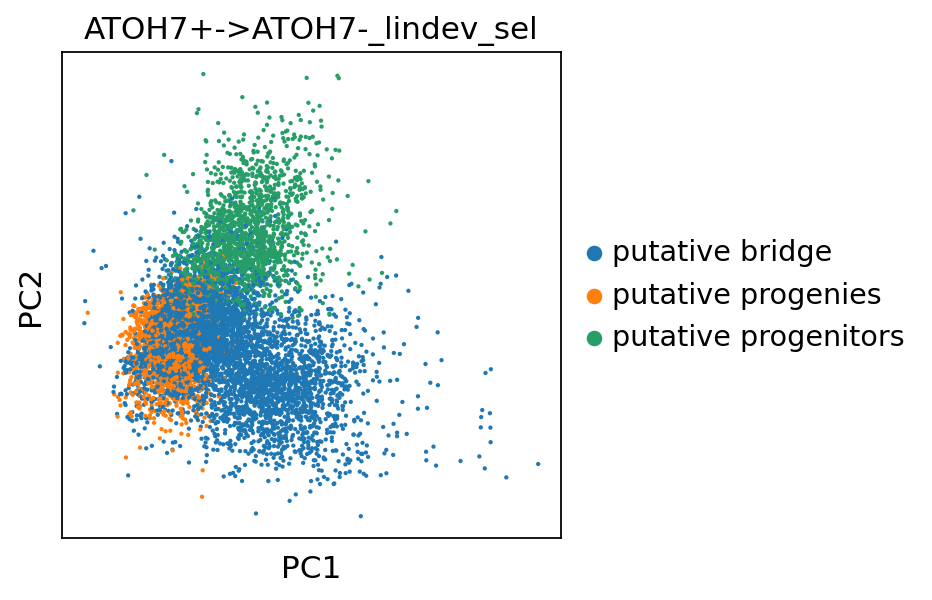

    finished (0:02:24) --> added 
    .var['ATOH7+->ATOH7-_rss'], pearson residuals of the linear fit.
    .obs['ATOH7+->ATOH7-_lindev_sel'], cell selections used for the test.


In [6]:
scf.tl.linearity_deviation(RGC,
                           start_milestone="ATOH7+",
                           end_milestone="ATOH7-",
                           n_jobs=20,plot=True,basis="pca")

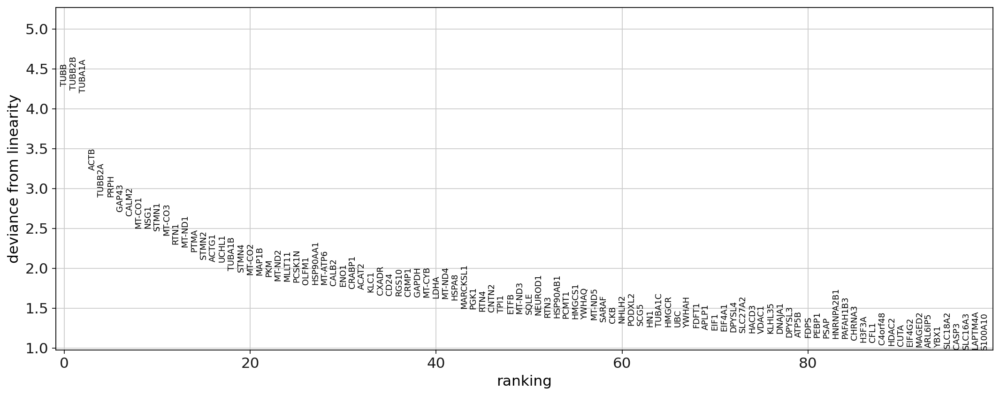

In [8]:
sc.set_figure_params(figsize = [16,6])
scf.pl.linearity_deviation(RGC,
                           start_milestone="ATOH7+",
                           end_milestone="ATOH7-", ntop_genes  = 100) #, save = 'degs.pdf'

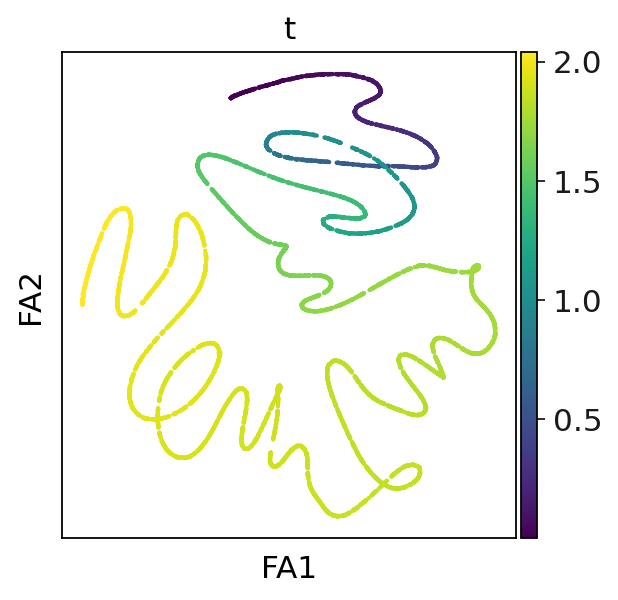

In [117]:
sc.set_figure_params()
sc.pl.draw_graph(RGC,color=["t"], use_raw = False)

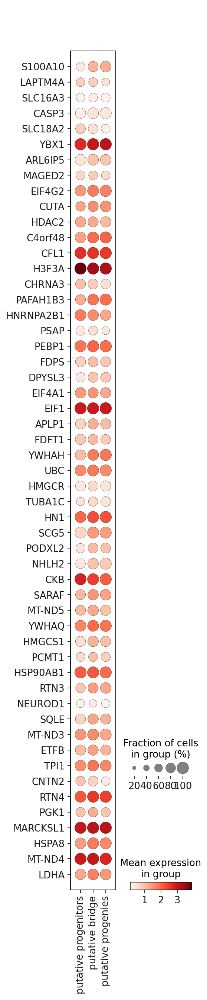

In [9]:
markers = ['S100A10', 'LAPTM4A', 'SLC16A3', 'CASP3', 'SLC18A2', 'YBX1', 'ARL6IP5', 'MAGED2', 
           'EIF4G2', 'CUTA', 'HDAC2', 'C4orf48', 'CFL1', 'H3F3A', 'CHRNA3', 'PAFAH1B3', 
           'HNRNPA2B1', 'PSAP', 'PEBP1', 'FDPS', 'DPYSL3','EIF4A1','EIF1','APLP1','FDFT1','YWHAH',
          'UBC','HMGCR','TUBA1C','HN1','SCG5','PODXL2','NHLH2','CKB','SARAF','MT-ND5','YWHAQ',
          'HMGCS1','PCMT1','HSP90AB1','RTN3','NEUROD1','SQLE','MT-ND3','ETFB','TPI1','CNTN2',
          'RTN4','PGK1','MARCKSL1','HSPA8','MT-ND4','LDHA']
new_order = ['putative progenitors', 'putative bridge', 'putative progenies']

# Reorder the categories
RGC.obs['ATOH7+->ATOH7-_lindev_sel'] = RGC.obs['ATOH7+->ATOH7-_lindev_sel'].cat.reorder_categories(new_order)

# Now, when you plot the dotplot, the columns will follow the order you set
sc.pl.dotplot(RGC, markers, groupby='ATOH7+->ATOH7-_lindev_sel', swap_axes=True, use_raw=False)

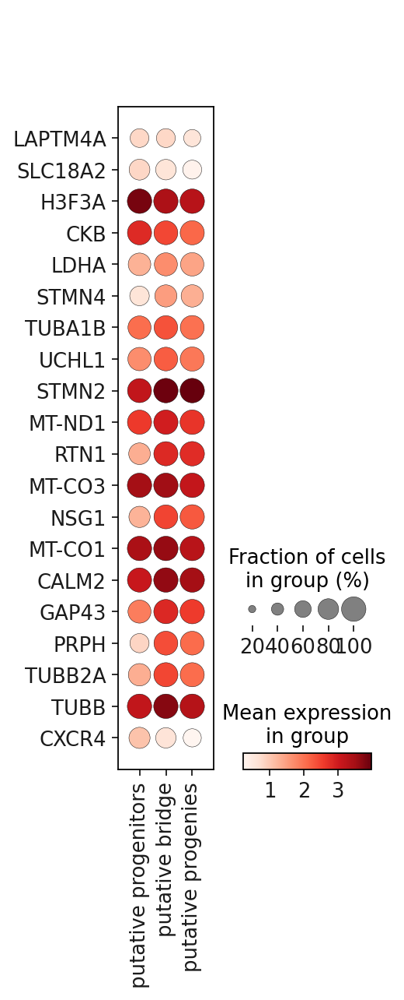

In [25]:
markers = ['LAPTM4A','SLC18A2','H3F3A','CKB','LDHA','STMN4','TUBA1B','UCHL1','STMN2','MT-ND1','RTN1','MT-CO3',
          'NSG1','MT-CO1','CALM2','GAP43','PRPH','TUBB2A','TUBB','CXCR4']
new_order = ['putative progenitors', 'putative bridge', 'putative progenies']

# Reorder the categories
RGC.obs['ATOH7+->ATOH7-_lindev_sel'] = RGC.obs['ATOH7+->ATOH7-_lindev_sel'].cat.reorder_categories(new_order)

# Now, when you plot the dotplot, the columns will follow the order you set
sc.pl.dotplot(RGC, markers, groupby='ATOH7+->ATOH7-_lindev_sel', swap_axes=True, use_raw=False)

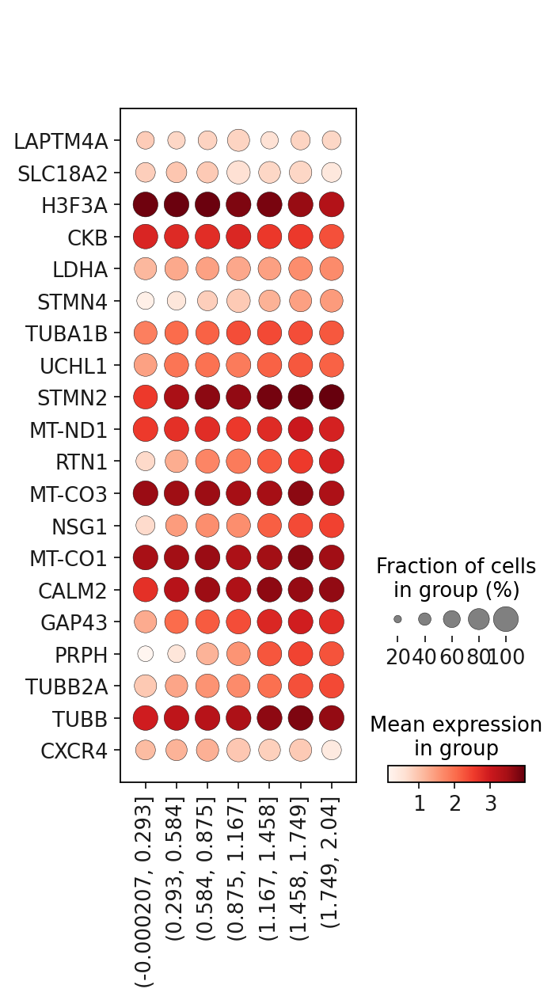

In [26]:
sc.pl.dotplot(RGC, markers, groupby='t', swap_axes=True, use_raw=False) #, save = 'dotplot.pdf'

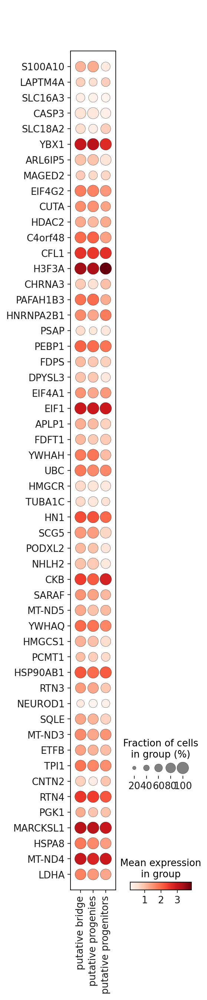

In [154]:
sc.pl.dotplot(RGC, markers, groupby='ATOH7+->ATOH7-_lindev_sel', swap_axes=True, use_raw = False)

In [ ]:
RGC.write_h5ad('/mnt/c/Bioinf/HUMAN_FETAL_RETINA/scfates_rgc.h5ad')

In [27]:
def categorize_t(value):
    if value <= 0.293:
        return 't1]'
    elif value <= 0.584:
        return 't2]'
    elif value <= 0.875:
        return 't3]'
    elif value <= 1.167:
        return 't4]'
    elif value <= 1.458:
        return 't5]'
    elif value <= 1.749:
        return 't6]'
    else:
        return 't7'


RGC.obs['t_factor'] = RGC.obs['t'].apply(categorize_t)

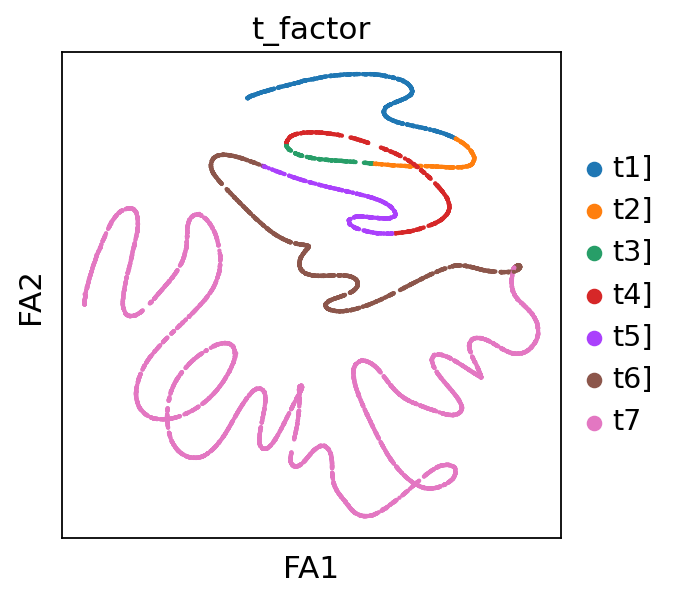

In [28]:
sc.set_figure_params()
sc.pl.draw_graph(RGC,color=["t_factor"], use_raw = False, save = 't_factor.pdf')

In [17]:
gene_symbols_string = 'ABL1,ACTB,ACTBL2,ACTG1,ACTL9,ADAM17,ADARB1,ADCY1,ADCY10,ADGRB1,ADNP,AFG3L2,ALCAM,AMIGO1,ANAPC2,ANK3,ANOS1,APBB1,APLP1,APLP2,APOA4,APOD,APOE,APP,ARHGAP35,ARHGAP4,ARHGEF25,ARHGEF28,ARHGEF40,ARTN,ARX,ATL1,ATOH1,ATOH7,ATP8A2,AUTS2,B3GNT2,B4GALT5,B4GALT6,B4GAT1,BAIAP2,BARHL2,BCL11B,BCL2,BDNF,BHLHA15,BHLHE22,BHLHE23,BMP7,BMPR1B,BMPR2,BOC,BRAF,BRSK1,BRSK2,C12orf57,C9orf72,CAMSAP2,CASP3,CCK,CCKAR,CDH1,CDH11,CDH2,CDH4,CDK5,CDK5R1,CDK5R2,CDKL3,CDKL5,CERS2,CHL1,CHN1,CHODL,CHRNB2,CNP,CNR1,CNTF,CNTN1,CNTN2,CNTN4,CNTN5,CNTN6,CNTNAP1,COBL,CRABP2,CREB1,CRPPA,CRTAC1,CSF1R,CSPG5,CTNNA1,CTNNA2,CTTN,CXCL12,CYFIP1,CYFIP2,DAB1,DAG1,DCC,DCLK1,DDR1,DHFR,DHFRP1,DIP2B,DISC1,DLX5,DNM2,DOCK7,DPYSL5,DRAXIN,DRD2,DRGX,DSCAM,DSCAML1,DVL1,ECE1,EDN1,EDN2,EDN3,EDNRA,EFNA1,EFNA2,EFNA3,EFNA4,EFNA5,EFNB1,EFNB2,EFNB3,EGR2,EIF4G2,EMB,ENAH,EPHA10,EPHA3,EPHA4,EPHA5,EPHA6,EPHA7,EPHA8,EPHB1,EPHB2,EPHB3,EPHB6,ERBB2,ETV1,EVX1,EXT1,FBXO45,FEZ1,FEZ2,FEZF1,FEZF2,FGF13,FGF8,FGFR2,FKBP1B,FLNA,FLOT1,FLRT2,FLRT3,FN1,FOLR1,FOXB1,FOXD1,FOXG1,FSTL4,FYN,FZD3,GAP43,GATA3,GBX1,GBX2,GDF7,GDI1,GDNF,GFRA3,GLI2,GLI3,GOLGA4,GPM6B,GRM7,GRN,GSK3B,HDAC6,HMCN2,HOXA2,HSP90AA1,HSP90AB1,IFRD1,IGF1R,IGSF9,INPP5F,ISL1,ISL2,ISLR2,IST1,ITGA4,ITGB1,JAK2,KALRN,KCNA1,KEL,KIAA0319,KIAA1755,KIF13B,KIF5A,KIF5B,KIF5C,KIFBP,KLF4,KLF7,KREMEN1,L1CAM,LAMA2,LAMB2,LGI1,LGR6,LHX1,LHX2,LHX3,LHX4,LHX9,LIMK1,LLGL1,LMO4,LMX1A,LPAR3,LRIG2,LRP4,LRRC4C,LRTM1,LRTM2,LYPLA2,MACF1,MAG,MAP1A,MAP1B,MAP1S,MAP2,MAP2K1,MAP2K2,MAP3K13,MAP6,MAPK8IP3,MAPT,MARK2,MCF2,MEGF8,METRN,MGARP,MIR221,MIR222,MIR431,MMP2,MT3,MTR,MYCBP2,MYOT,MYPN,NCAM1,NCAM2,NDEL1,NDN,NDP,NECTIN1,NEFH,NEFL,NEO1,NEUROD1,NEUROD2,NEUROD4,NEUROD6,NEUROG1,NEUROG2,NEUROG3,NEXN,NFASC,NFIB,NGF,NGFR,NIBAN2,NIN,NKX2-1,NKX2-8,NKX6-1,NLGN3,NMNAT2,NOG,NOTCH1,NOTCH2,NOTCH3,NOVA2,NPR2,NPTX1,NR2E1,NR4A2,NRCAM,NRDC,NREP,NRP1,NRP2,NRXN1,NRXN3,NTN1,NTN3,NTNG1,NTNG2,NTRK1,NTRK2,NUMB,NUMBL,OLFM1,OLIG1,OLIG2,OLIG3,OPHN1,OR10A4,OTX2,PAFAH1B1,PAK1,PAK2,PAK3,PALLD,PARD3,PARD6B,PAX2,PAX6,PCDHAC2,PHOX2B,PICALM,PLA2G10,PLEKHG4,PLEKHG4B,PLP1,PLPPR4,PLXNA1,PLXNA2,PLXNA3,PLXNA4,PLXNB1,PLXNB2,PLXNB3,PLXNC1,PLXND1,POTEE,POTEF,POTEI,POTEJ,POTEKP,POU3F2,POU4F1,POU4F2,POU4F3,PPP3CB,PRDM8,PRICKLE1,PRKCQ,PRKG1,PSEN1,PTCH1,PTEN,PTK2,PTK7,PTN,PTPN11,PTPRF,PTPRM,PTPRO,PTPRS,PTPRZ1,PUM2,RAB10,RAB21,RAB3A,RAB8A,RAC1,RAC3,RAPH1,RELN,RET,RGMA,RND2,RNF165,RNF6,ROBO1,ROBO2,ROBO3,ROBO4,RPL24,RPS6KA5,RTN4,RTN4R,RTN4RL1,RTN4RL2,RUFY3,RYK,S100A6,S100B,SCARF1,SCN11A,SCN1B,SEMA3A,SEMA3B,SEMA3C,SEMA3D,SEMA3E,SEMA3F,SEMA3G,SEMA4A,SEMA4B,SEMA4C,SEMA4D,SEMA4F,SEMA4G,SEMA5A,SEMA5B,SEMA6A,SEMA6B,SEMA6C,SEMA6D,SEMA7A,SHH,SHOX2,SHTN1,SIAH1,SIN3A,SIPA1L1,SKIL,SLC25A46,SLC9A6,SLIT1,SLIT2,SLIT3,SLITRK1,SLITRK2,SLITRK3,SLITRK4,SLITRK5,SLITRK6,SMAD4,SMO,SMURF1,SNAP25,SOS1,SPART,SPAST,SPG11,SPP1,SPTBN4,SRF,SSNA1,STK11,STK24,STK25,STMN1,STXBP1,SVBP,SYNGAP1,SZT2,TAOK2,TBC1D24,TBCE,TBR1,TCTN1,THY1,TIAM1,TIAM2,TNC,TNFRSF21,TNN,TNR,TOP2B,TRAK1,TRIM32,TRIM46,TRIO,TRPC5,TRPV2,TSKU,TSPAN2,TSPO,TTC8,TTL,TUBB2B,TUBB3,TWF2,UCHL1,ULK1,ULK2,UNC5A,UNC5B,UNC5C,UNC5D,USP33,USP9X,UST,VASH2,VASP,VAX1,VAX2,VCL,VEGFA,WDR47,WNT3,WNT3A,WNT5A,WNT7A,XK,YTHDF1,ZDHHC17,ZFYVE27,ZPR1'

In [18]:
gene_symbols_list = gene_symbols_string.split(',')


print(gene_symbols_list)

['ABL1', 'ACTB', 'ACTBL2', 'ACTG1', 'ACTL9', 'ADAM17', 'ADARB1', 'ADCY1', 'ADCY10', 'ADGRB1', 'ADNP', 'AFG3L2', 'ALCAM', 'AMIGO1', 'ANAPC2', 'ANK3', 'ANOS1', 'APBB1', 'APLP1', 'APLP2', 'APOA4', 'APOD', 'APOE', 'APP', 'ARHGAP35', 'ARHGAP4', 'ARHGEF25', 'ARHGEF28', 'ARHGEF40', 'ARTN', 'ARX', 'ATL1', 'ATOH1', 'ATOH7', 'ATP8A2', 'AUTS2', 'B3GNT2', 'B4GALT5', 'B4GALT6', 'B4GAT1', 'BAIAP2', 'BARHL2', 'BCL11B', 'BCL2', 'BDNF', 'BHLHA15', 'BHLHE22', 'BHLHE23', 'BMP7', 'BMPR1B', 'BMPR2', 'BOC', 'BRAF', 'BRSK1', 'BRSK2', 'C12orf57', 'C9orf72', 'CAMSAP2', 'CASP3', 'CCK', 'CCKAR', 'CDH1', 'CDH11', 'CDH2', 'CDH4', 'CDK5', 'CDK5R1', 'CDK5R2', 'CDKL3', 'CDKL5', 'CERS2', 'CHL1', 'CHN1', 'CHODL', 'CHRNB2', 'CNP', 'CNR1', 'CNTF', 'CNTN1', 'CNTN2', 'CNTN4', 'CNTN5', 'CNTN6', 'CNTNAP1', 'COBL', 'CRABP2', 'CREB1', 'CRPPA', 'CRTAC1', 'CSF1R', 'CSPG5', 'CTNNA1', 'CTNNA2', 'CTTN', 'CXCL12', 'CYFIP1', 'CYFIP2', 'DAB1', 'DAG1', 'DCC', 'DCLK1', 'DDR1', 'DHFR', 'DHFRP1', 'DIP2B', 'DISC1', 'DLX5', 'DNM2', 'DOCK7',

In [20]:
present_genes = [gene for gene in gene_symbols_list if gene in RGC.var_names]

non_zero_genes = []

for gene in present_genes:
    
    if RGC[:, gene].X.sum() > 0:
        non_zero_genes.append(gene)


print(f"Markers present and non-zero in the dataset: {non_zero_genes}")

Markers present and non-zero in the dataset: ['ABL1', 'ACTB', 'ACTG1', 'ADAM17', 'ADARB1', 'ADCY1', 'ADCY10', 'ADGRB1', 'ADNP', 'AFG3L2', 'ALCAM', 'AMIGO1', 'ANAPC2', 'ANK3', 'ANOS1', 'APBB1', 'APLP1', 'APLP2', 'APOD', 'APOE', 'APP', 'ARHGAP35', 'ARHGAP4', 'ARHGEF25', 'ARHGEF28', 'ARHGEF40', 'ARTN', 'ARX', 'ATL1', 'ATOH1', 'ATOH7', 'ATP8A2', 'AUTS2', 'B3GNT2', 'B4GALT5', 'B4GALT6', 'B4GAT1', 'BAIAP2', 'BARHL2', 'BCL11B', 'BCL2', 'BDNF', 'BHLHE22', 'BHLHE23', 'BMP7', 'BMPR1B', 'BMPR2', 'BOC', 'BRAF', 'BRSK1', 'BRSK2', 'C12orf57', 'C9orf72', 'CAMSAP2', 'CASP3', 'CCK', 'CDH11', 'CDH2', 'CDH4', 'CDK5', 'CDK5R1', 'CDK5R2', 'CDKL3', 'CDKL5', 'CERS2', 'CHL1', 'CHN1', 'CHODL', 'CHRNB2', 'CNP', 'CNR1', 'CNTN1', 'CNTN2', 'CNTN4', 'CNTN5', 'CNTN6', 'CNTNAP1', 'COBL', 'CRABP2', 'CREB1', 'CRTAC1', 'CSPG5', 'CTNNA1', 'CTNNA2', 'CTTN', 'CXCL12', 'CYFIP1', 'CYFIP2', 'DAB1', 'DAG1', 'DCC', 'DCLK1', 'DDR1', 'DHFR', 'DIP2B', 'DISC1', 'DNM2', 'DOCK7', 'DPYSL5', 'DRAXIN', 'DRD2', 'DRGX', 'DSCAM', 'DSCAML1'

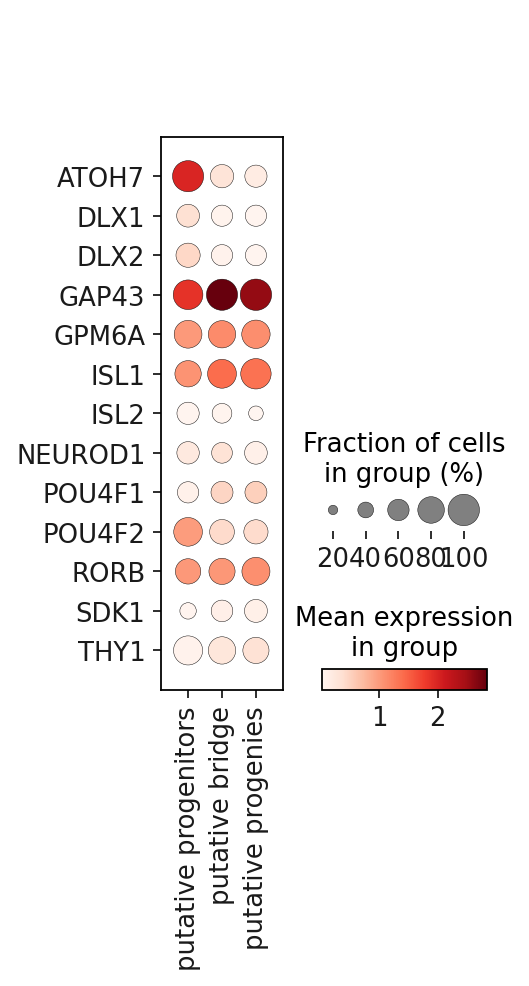

In [47]:
markers = ['ATOH7', 'DLX1', 'DLX2','GAP43', 'GPM6A',  'ISL1', 'ISL2','NEUROD1', 'POU4F1', 'POU4F2',  'RORB','SDK1', 'THY1']
new_order = ['putative progenitors', 'putative bridge', 'putative progenies']

# Reorder the categories
RGC.obs['ATOH7+->ATOH7-_lindev_sel'] = RGC.obs['ATOH7+->ATOH7-_lindev_sel'].cat.reorder_categories(new_order)

# Now, when you plot the dotplot, the columns will follow the order you set
sc.pl.dotplot(RGC, markers, groupby='ATOH7+->ATOH7-_lindev_sel', swap_axes=True, use_raw=False)

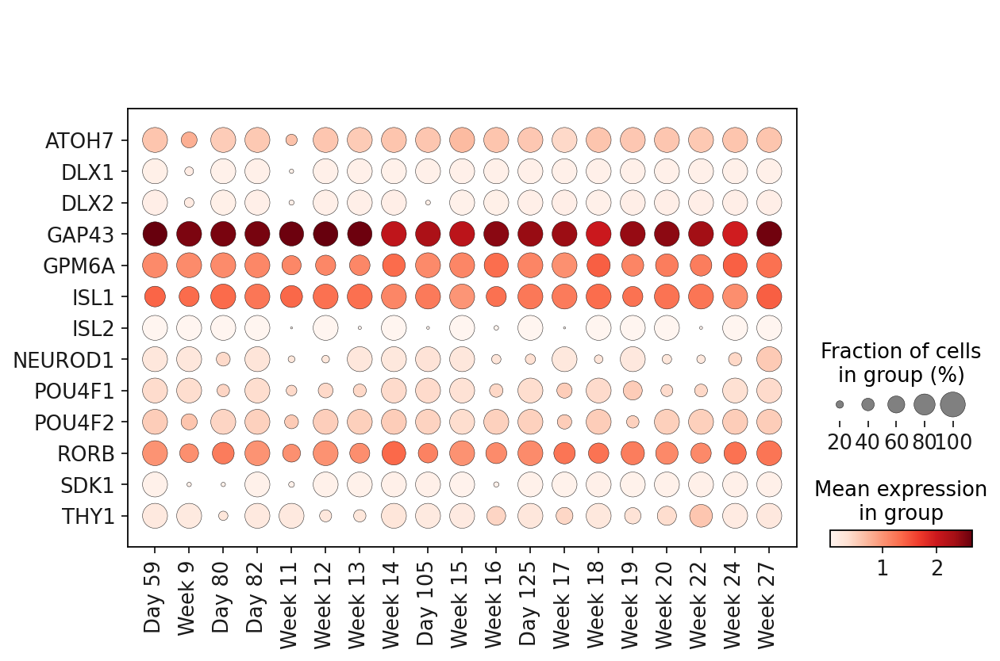

In [55]:
sc.pl.dotplot(RGC, markers, groupby='timepoint', swap_axes=True, use_raw=False)  #, save = 'dotplot_neu2.pdf'

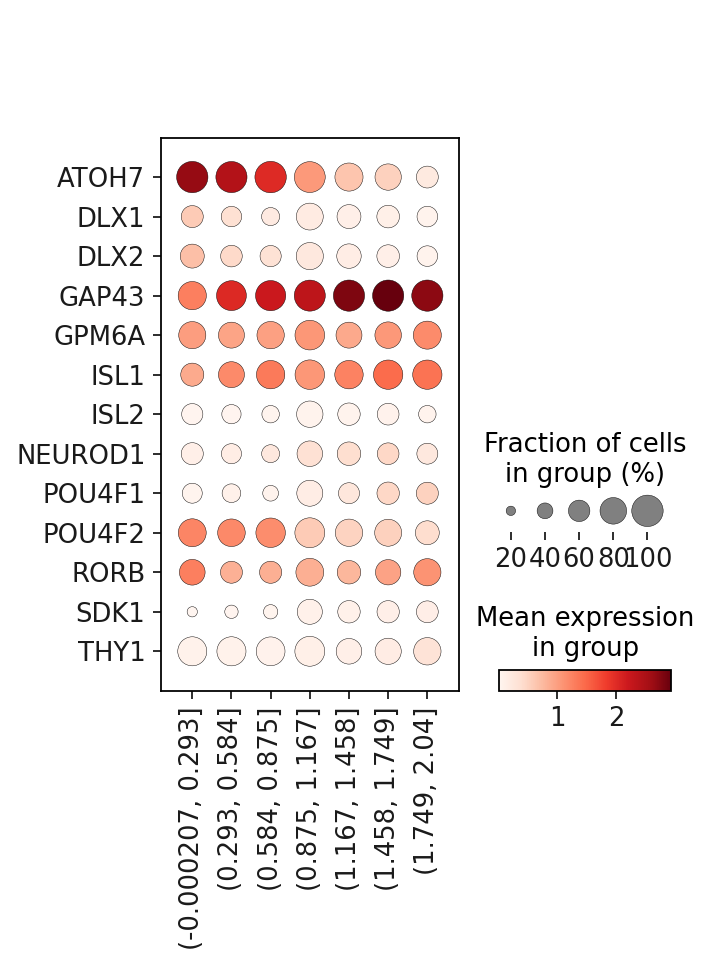

In [56]:
sc.pl.dotplot(RGC, markers, groupby='t', swap_axes=True, use_raw=False) #, save = 'dotplot_neu1.pdf'

In [50]:
cell_ids = RGC.obs.index
t_factor = RGC.obs['t_factor']

# Creating a DataFrame
df = pd.DataFrame({'Cell_ID': cell_ids, 't_factor': t_factor})

df

,Cell_ID,t_factor
Hgw11.AAACCTGAGACAATAC.1_1,Hgw11.AAACCTGAGACAATAC.1_1,t7
Hgw11.AAACCTGAGACGCTTT.1_1,Hgw11.AAACCTGAGACGCTTT.1_1,t1]
Hgw11.AAACCTGAGTTGAGTA.1_1,Hgw11.AAACCTGAGTTGAGTA.1_1,t7
Hgw11.AAACCTGTCGATCCCT.1_1,Hgw11.AAACCTGTCGATCCCT.1_1,t7
Hgw11.AAACGGGAGATGCCAG.1_1,Hgw11.AAACGGGAGATGCCAG.1_1,t2]
...,...,...
TCACTCGAGCCAAGCA-1_23,TCACTCGAGCCAAGCA-1_23,t7
TCCATCGGTGCCTACG-1_23,TCCATCGGTGCCTACG-1_23,t4]
TGCATCCGTCGAACGA-1_23,TGCATCCGTCGAACGA-1_23,t7
TTACAGGCAACCACAT-1_23,TTACAGGCAACCACAT-1_23,t6]


In [51]:
# Exporting to CSV
df.to_csv('/mnt/c/Users/rodri/Downloads/RGC_t_factor.csv', index=False)

In [57]:
contingency_table = pd.crosstab(RGC.obs['timepoint'], RGC.obs['t_factor'])

# Print the contingency table
print(contingency_table)

t_factor   t1]  t2]  t3]  t4]  t5]  t6]    t7
timepoint                                    
Day 59      65   52   24   65   85  196   514
Week 9     273   54   24   30   45  103   463
Day 80       1   10    6    9   16   30    62
Day 82       3    2    9  151   21   78   267
Week 11    228  107   87   79  101  398  1701
Week 12     25    1    1    2   24  201   365
Week 13     37   11    9   12   53  108   988
Week 14      0    0    0    1    2   37    19
Day 105      0    1    1    2    1    8     5
Week 15      5    1    5    6   12   16    16
Week 16      0    0    0    1    5    4    38
Day 125      0    2    1   62   27   32   233
Week 17      0    1    1    0    2    1    22
Week 18      0    0    0    0    1   12     8
Week 19      0    2    2    1    5    9    62
Week 20      1    0    1    6   16   13    80
Week 22      1    0    0    0    1    1    14
Week 24      1    0    0    0    4   14     2
Week 27      0    0    0    0    0    3     0


In [72]:
def cluster_small_multiples(adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        
        # Assign colors based on the prefix of the category
        if clust.startswith('Day'):
            color = "#2daed8"  # Blue for "Day"
        elif clust.startswith('Week'):
            color = "#FFA500"  # Orange for "Week"
        else:
            color = "#d3d3d3"  # Default gray color for other categories
        
        tmp.uns[clust + "_colors"] = ["#d3d3d3", color]  # Assign the chosen color

    sc.pl.draw_graph(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs, save = 'recolored_multiplies.pdf'
    )

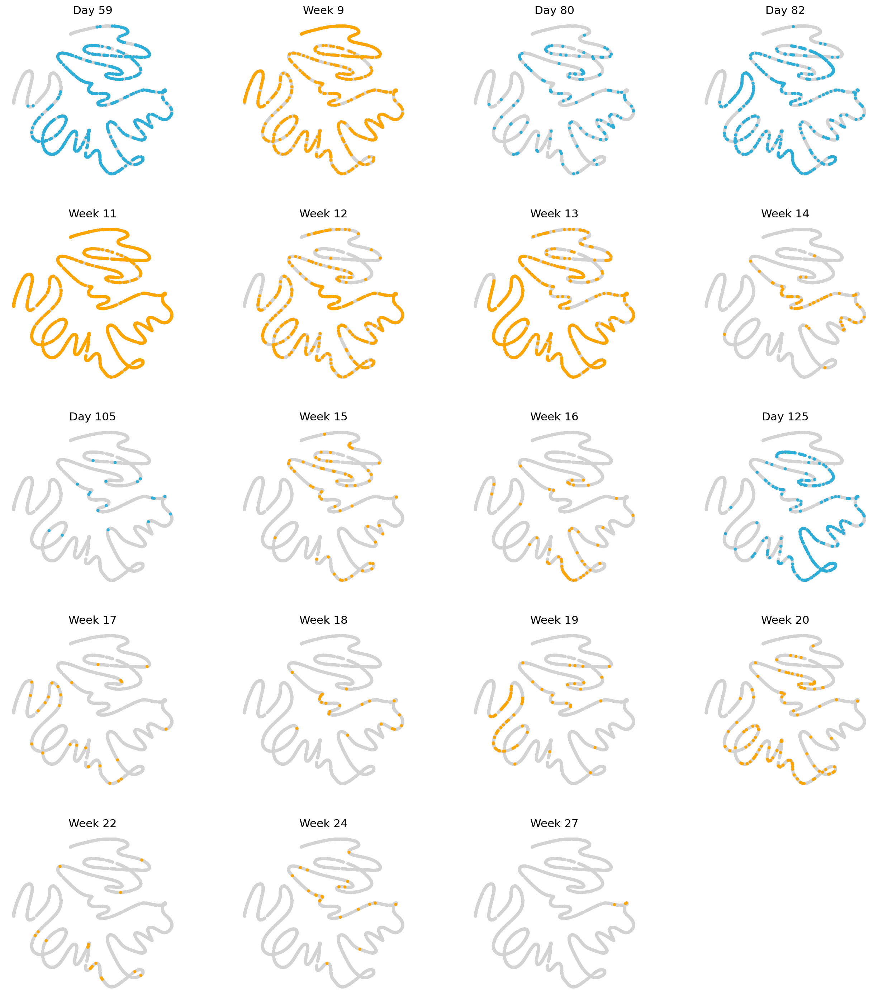

In [73]:
cluster_small_multiples(RGC, clust_key = 'timepoint')

In [3]:
fetal_total = sc.read_h5ad("/mnt/c/Bioinf/HUMAN_FETAL_RETINA/COMBINED_EKPB_v1_clean_RNA.h5ad")

In [16]:
fetal_total.__dict__['_raw'].__dict__['_var'] = fetal_total.__dict__['_raw'].__dict__['_var'].rename(columns={'_index': 'features'})

In [17]:
fetal_total.write_h5ad('/mnt/c/Bioinf/HUMAN_FETAL_RETINA/COMBINED_EKPB_v1_clean_RNA_indexed_filt.h5ad')

In [96]:
fetal_total

AnnData object with n_obs × n_vars = 113073 × 36144
    obs: 'nCount_RNA', 'nFeature_RNA', 'Retina_Cells', 'percent.rb', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'origin', 'timepoint', 'EK_PB_annov1'
    var: 'features'
    obsm: 'X_tsne', 'X_umap'

In [ ]:
fetal_total = sc.read_h5ad("/mnt/c/Bioinf/HUMAN_FETAL_RETINA/COMBINED_EKPB_v1_clean_RNA.h5ad")

In [5]:
fetal_total = sc.read_h5ad("/mnt/c/Bioinf/HUMAN_FETAL_RETINA/COMBINED_EKPB_v1_clean_int_indexed.h5ad")

In [6]:
fetal_total

AnnData object with n_obs × n_vars = 113073 × 2000
    obs: 'nCount_RNA', 'nFeature_RNA', 'Retina_Cells', 'percent.rb', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'origin', 'timepoint', 'EK_PB_annov1'
    var: 'features'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances'

In [10]:
fetal_total.obs

,nCount_RNA,nFeature_RNA,Retina_Cells,percent.rb,percent.mt,S.Score,G2M.Score,Phase,origin,timepoint,EK_PB_annov1
Hgw11.AAACCTGAGACAATAC.1_1,7630.0,2760,1,15.648755,1.061599,-0.625942,-0.812992,G1,Lu,Week 11,2
Hgw11.AAACCTGAGACGCTTT.1_1,1966.0,1011,1,21.566633,1.881994,-0.135045,-0.205367,G1,Lu,Week 11,2
Hgw11.AAACCTGAGCGTCTAT.1_1,3729.0,1469,1,33.118799,3.378922,0.074858,-0.185090,S,Lu,Week 11,3
Hgw11.AAACCTGAGTTGAGTA.1_1,2348.0,1309,1,9.582624,5.408859,-0.169082,-0.265821,G1,Lu,Week 11,2
Hgw11.AAACCTGCAAGTAATG.1_1,3732.0,1700,1,30.305466,1.125402,-0.075609,-0.339944,G1,Lu,Week 11,3
...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTTATTCTC-1_23,6715.0,2715,2,16.798213,2.874162,0.255948,-0.487672,S,Thomas Reh Lab,Day 125,6
TTTGGTTTCCATTCAT-1_23,5706.0,2399,2,15.054329,4.433929,0.443079,-0.237750,S,Thomas Reh Lab,Day 125,3
TTTGTTGAGCATCGAG-1_23,12042.0,3342,2,19.282511,9.890384,-0.552566,-0.525181,G1,Thomas Reh Lab,Day 125,9
TTTGTTGCAAATACGA-1_23,7824.0,2868,2,12.154908,6.786810,-0.120949,1.409193,G2M,Thomas Reh Lab,Day 125,6


In [11]:
fetal_total.layers["counts"] = fetal_total.X.copy()

In [24]:
sc.pp.filter_cells(fetal_total, min_counts = 100)

filtered out 4925 cells that have less than 100 counts


In [26]:
sc.pp.filter_genes(fetal_total,  min_counts = 200)

filtered out 24 genes that are detected in less than 200 counts


In [27]:
fetal_total

AnnData object with n_obs × n_vars = 24529 × 1295
    obs: 'nCount_RNA', 'nFeature_RNA', 'Retina_Cells', 'percent.rb', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'origin', 'timepoint', 'EK_PB_annov1', 'n_counts'
    var: 'features', 'n_counts'
    uns: 'neighbors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances'

In [23]:
fetal_total.layers['counts']

array([[-0.40996703,  0.60602327,  0.40396679, ...,  0.23453384,
        -0.33162441,  0.38891676],
       [-0.25943375, -0.31544579,  2.54533741, ..., -0.03081738,
        -0.13837878,  0.42665233],
       [-0.20505352, -0.02876254,  2.70922481, ...,  0.16572632,
        -0.25251632,  1.27537627],
       ...,
       [-0.74599227, -0.02421764,  0.26908977, ..., -1.26318012,
         0.27767006,  0.0210148 ],
       [ 0.2680327 ,  1.55153601,  0.8030652 , ..., -0.05031543,
        -0.07076577, -0.85678124],
       [-0.31144819,  1.62053805,  1.9609112 , ...,  0.01641485,
        -0.35275634,  0.05642645]])

In [14]:
fetal_total = fetal_total[fetal_total.obs['n_genes'] >= 40]
fetal_total.n_obs

112228

In [28]:
fetal_total.write_h5ad('/mnt/c/Bioinf/HUMAN_FETAL_RETINA/COMBINED_EKPB_v1_clean_int_indexed_layersfilt100200.h5ad')

In [3]:
RGC = sc.read_h5ad('/mnt/c/Bioinf/HUMAN_FETAL_RETINA/RGC.h5ad')

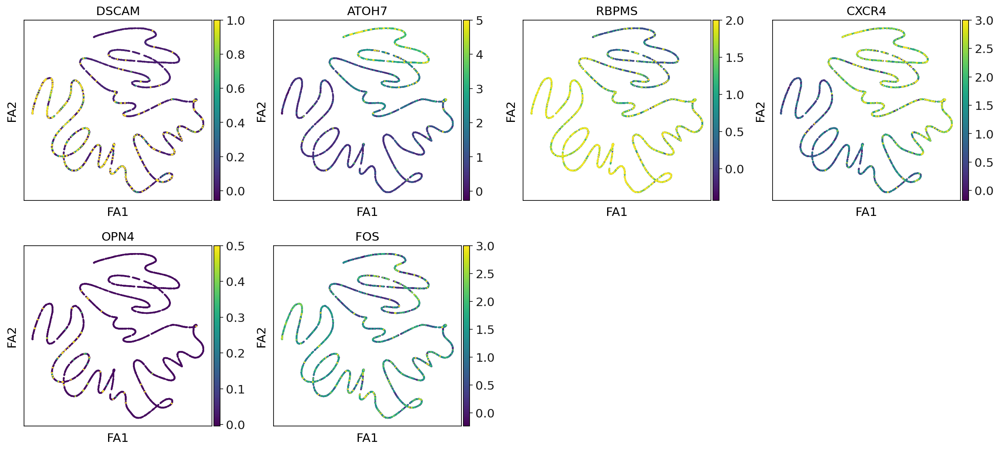

In [17]:
sc.pl.draw_graph(RGC,color=["DSCAM",'ATOH7','RBPMS','CXCR4','OPN4','FOS'], use_raw = False, vmax = [1,5,2,3,0.5,3])

In [18]:
sc.set_figure_params(vector_friendly = False)

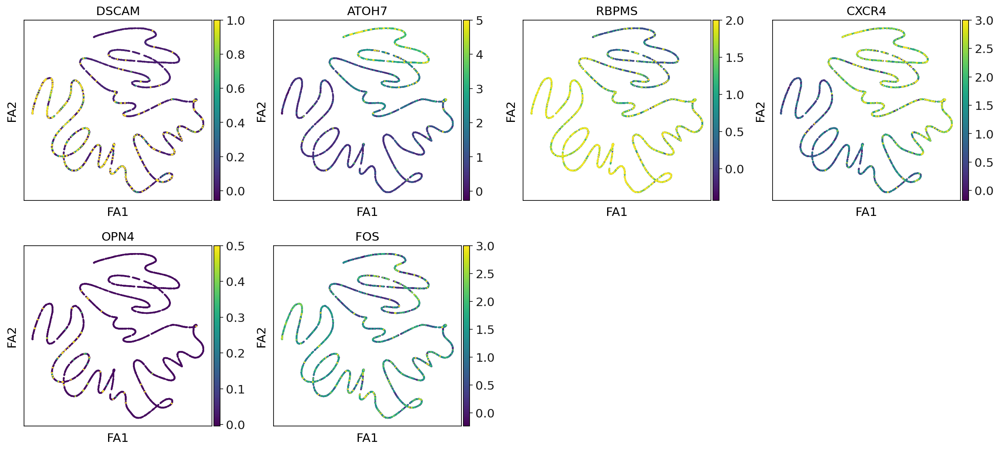

In [19]:
sc.pl.draw_graph(RGC,color=["DSCAM",'ATOH7','RBPMS','CXCR4','OPN4','FOS'], use_raw = False, vmax = [1,5,2,3,0.5,3], save = 'Jon_DSCAM_RGC_HFR.pdf')

In [30]:
RGC

AnnData object with n_obs × n_vars = 8026 × 36144
    obs: 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'X', 'barcode', 'sample', 'Age', 'Retina_Cells', 'percent.rb', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1', 'seurat_clusters', 'pANN_0.25_0.19_814', 'DF.classifications_0.25_0.19_814', 'DF.classifications_0.25_0.19_756', 'origin', 'timepoint', 'pANN_0.25_0.005_732', 'DF.classifications_0.25_0.005_732', 'DF.classifications_0.25_0.005_675', 'pANN_0.25_0.21_844', 'DF.classifications_0.25_0.21_844', 'DF.classifications_0.25_0.21_771', 'pANN_0.25_0.08_516', 'DF.classifications_0.25_0.08_516', 'DF.classifications_0.25_0.08_467', 'pANN_0.25_0.25_1019', 'DF.classifications_0.25_0.25_1019', 'DF.classifications_0.25_0.25_950', 'pANN_0.25_0.01_308', 'DF.classifications_0.25_0.01_308', 'DF.classifications_0.25_0.01_278', 'pANN_0.25_0.3_734', 'DF.classifications_0.25_0.3_734', 'DF.classifications_0.25_0.3_672', 'pANN_0.25_0.08_357', 'DF.classifications_0.25_0.08_357', 'DF.classi

In [34]:
#sc.pp.pca(RGC, n_comps=50)
pca_projections = pd.DataFrame(RGC.obsm["X_pca"],index=RGC.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=2)
RGC.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(RGC,n_neighbors=30,use_rep="X_palantir")
RGC.obsm["X_pca2d"]=RGC.obsm["X_pca"][:,:2]
sc.tl.draw_graph(RGC,init_pos='X_pca2d')

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:22)


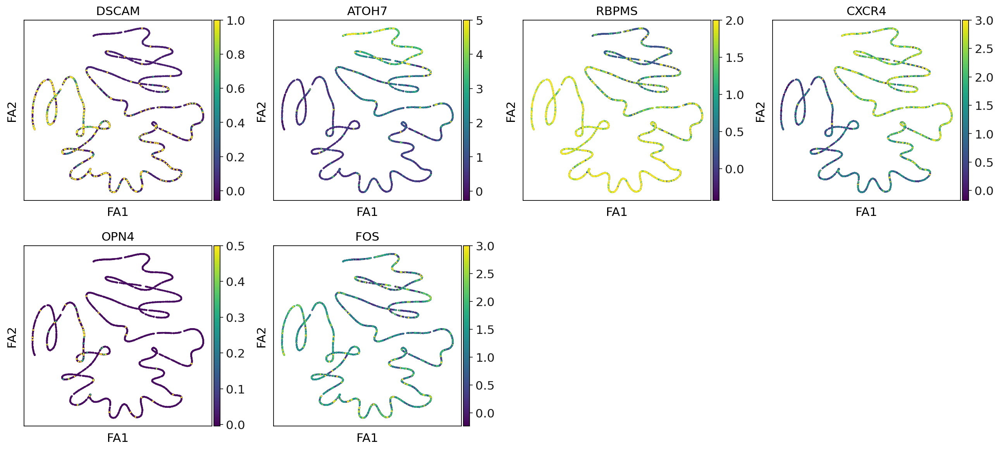

In [35]:
sc.pl.draw_graph(RGC,color=["DSCAM",'ATOH7','RBPMS','CXCR4','OPN4','FOS'], use_raw = False, vmax = [1,5,2,3,0.5,3])

In [37]:
dm_res

{'T': <8026x8026 sparse matrix of type '<class 'numpy.float64'>'
 	with 374150 stored elements in Compressed Sparse Row format>,
 'EigenVectors':                                    0         1         2         3         4  \
 Hgw11.AAACCTGAGACAATAC.1_1 -0.011162  0.006844  0.005922  0.007860 -0.021521   
 Hgw11.AAACCTGAGACGCTTT.1_1 -0.011162 -0.029010  0.001451 -0.000803  0.009289   
 Hgw11.AAACCTGAGTTGAGTA.1_1 -0.011162  0.005417 -0.017745 -0.000914  0.004645   
 Hgw11.AAACCTGTCGATCCCT.1_1 -0.011162  0.007971  0.012101  0.001264  0.024526   
 Hgw11.AAACGGGAGATGCCAG.1_1 -0.011162 -0.025330  0.001303  0.005975  0.000863   
 ...                              ...       ...       ...       ...       ...   
 TCACTCGAGCCAAGCA-1_23      -0.011162  0.005009  0.005377  0.001447 -0.005790   
 TCCATCGGTGCCTACG-1_23      -0.011162 -0.010008  0.001053 -0.023831  0.001281   
 TGCATCCGTCGAACGA-1_23      -0.011162  0.007339  0.005371  0.006492 -0.019396   
 TTACAGGCAACCACAT-1_23      -0.011162  0.0001

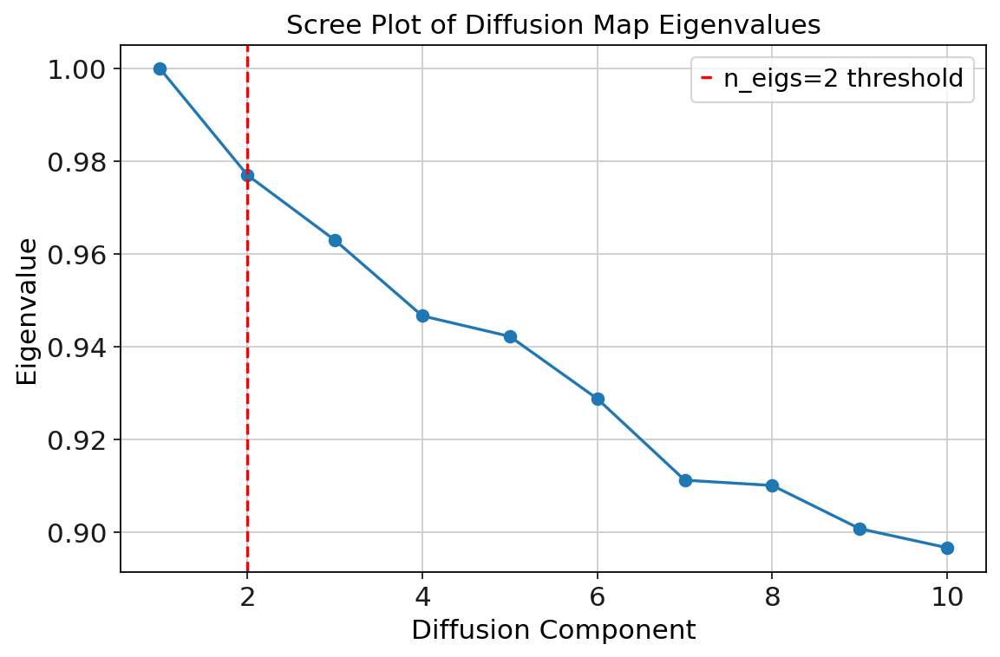

In [39]:
eigenvalues = dm_res['EigenValues']
components = np.arange(1, len(eigenvalues) + 1)

plt.figure(figsize=(8, 5))
plt.plot(components, eigenvalues, marker='o', linestyle='-')
plt.xlabel('Diffusion Component')
plt.ylabel('Eigenvalue')
plt.title('Scree Plot of Diffusion Map Eigenvalues')
plt.axvline(x=2, color='red', linestyle='--', label='n_eigs=2 threshold')
plt.legend()
plt.show()